In [1]:
import os
import gzip
import gc
import re

from io import StringIO
from google.cloud import storage
from dotenv import load_dotenv

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

import torch
import torch.nn.functional as F

from transformers import AutoModelForCausalLM
from transformers import AutoTokenizer, EsmForMaskedLM
from tokenizers import Tokenizer
from peft import get_peft_model, LoraConfig, TaskType

/opt/anaconda3/envs/MachLearn/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
from scipy.stats import wilcoxon
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
from plm_compare_progen2 import *
from plm_compare_esm import *
from protein_data import *
from pro_gen2_lora import *

In [4]:
def sort_key(s):
    eps = int(re.search(r'eps(\d+)', s).group(1))
    domain = re.search(r'(PF\d+_\d+)', s).group(1)
    return (domain, eps)



In [5]:
load_dotenv()
cred_path = os.getenv('GOOGLE_APPLICATION_CREDENTIALS')

os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = cred_path

client = storage.Client()
bucket = client.bucket('domainome-data')
blob = bucket.blob("base_LLRs.pkl.gz")

with gzip.open(blob.open("rb"), "rb") as f:
        dict_base = pickle.load(f)



In [6]:
filename = '/Users/johnhutchens/Desktop/Practicum/Data/Domainome/dict_dn_fitness.pkl'
with open(filename, "rb") as f:
    dict_dn_fitness = pickle.load(f)

# LoRA alpha test, num_samples = 40

In [7]:
folder = 'alpha_half_2026-04-21_lora_dicts_full/'

load_dotenv()
cred_path = os.getenv('GOOGLE_APPLICATION_CREDENTIALS')

os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = cred_path

client = storage.Client()
bucket = client.bucket('domainome-data')

blobs = bucket.list_blobs(prefix=folder)

rows = []

for blob in blobs:
    bname = blob.name
    model_key = "model-"+bname.split("/")[1].split("_lora")[0]
    # model_key = "model-"+bname.split("_lora")[0].split("/")[1]
    print(model_key)

    blob = bucket.blob(bname)
    with gzip.open(blob.open("rb"), "rb") as f:
        dict_lora = pickle.load(f)
    for dom_id in dict_dn_fitness.keys():
        uid = dict_dn_fitness[dom_id]['uniprot_id']

        if uid in dict_lora.keys():
            dom_pos = int(dict_dn_fitness[dom_id]['domain_start'])
            dom_seq = dict_dn_fitness[dom_id]['dom_seq']
            dom_len = int(len(dom_seq))

            # check if there is data in dict_lora[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1]
            if dom_pos - 1 + dom_len < 1024:
            
                seq = dict_lora[uid]['sequence']

                # print(dom_seq)
                # print(seq[dom_pos-1:dom_pos+dom_len-1])

                base_arr = dict_base[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1].flatten()
                lora_arr = dict_lora[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1].flatten()
                fitness = np.array(dict_dn_fitness[dom_id]['fitness'])

                # print(dom_id)
                lora_sp, _ = spearman_ignore_nan(lora_arr, fitness)
                base_sp, _ = spearman_ignore_nan(base_arr, fitness)
                diff_sp = lora_sp - base_sp
                # print(diff_sp)

                rows.append({
                    "model": model_key,
                    "lora_alpha": 0.5,
                    "domain_id": dom_id,
                    "uniprot_id": uid,
                    "lora_spearman": lora_sp,
                    "base_spearman": base_sp,
                    "diff_spearman": diff_sp
                })

df_alpha_half = pd.DataFrame(rows)     

model-O00308_PF00397_440
model-O14776_PF01846_793
model-O60281_PF00096_808
model-O75112_PF00595_1
model-O94929_PF00412_210
model-P08151_PF00096_363
model-P0CI26_PF00643_87
model-P22681_PF00627_854
model-P32081_PF00313_1
model-Q01826_PF02376_494
model-Q03052_PF00157_247
model-Q05655_PF00130_228
model-Q09472_PF02172_567
model-Q13368_PF00595_132
model-Q969G3_PF00505_67
model-Q96JN0_PF05225_353
model-Q96JY0_PF09011_3
model-Q9UJ78_PF06467_334
model-Q9UJV3_PF00643_191


In [8]:
folder = 'alpha_1_2026-04-22_lora_dicts_full/'

load_dotenv()
cred_path = os.getenv('GOOGLE_APPLICATION_CREDENTIALS')

os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = cred_path

client = storage.Client()
bucket = client.bucket('domainome-data')

blobs = bucket.list_blobs(prefix=folder)

rows = []

for blob in blobs:
    bname = blob.name
    model_key = "model-"+bname.split("/")[1].split("_lora")[0]
    # model_key = "model-"+bname.split("_lora")[0].split("/")[1]
    print(model_key)

    blob = bucket.blob(bname)
    with gzip.open(blob.open("rb"), "rb") as f:
        dict_lora = pickle.load(f)
    for dom_id in dict_dn_fitness.keys():
        uid = dict_dn_fitness[dom_id]['uniprot_id']

        if uid in dict_lora.keys():
            dom_pos = int(dict_dn_fitness[dom_id]['domain_start'])
            dom_seq = dict_dn_fitness[dom_id]['dom_seq']
            dom_len = int(len(dom_seq))

            # check if there is data in dict_lora[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1]
            if dom_pos - 1 + dom_len < 1024:
            
                seq = dict_lora[uid]['sequence']

                # print(dom_seq)
                # print(seq[dom_pos-1:dom_pos+dom_len-1])

                base_arr = dict_base[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1].flatten()
                lora_arr = dict_lora[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1].flatten()
                fitness = np.array(dict_dn_fitness[dom_id]['fitness'])

                # print(dom_id)
                lora_sp, _ = spearman_ignore_nan(lora_arr, fitness)
                base_sp, _ = spearman_ignore_nan(base_arr, fitness)
                diff_sp = lora_sp - base_sp
                # print(diff_sp)

                rows.append({
                    "model": model_key,
                    "lora_alpha": 1,
                    "domain_id": dom_id,
                    "uniprot_id": uid,
                    "lora_spearman": lora_sp,
                    "base_spearman": base_sp,
                    "diff_spearman": diff_sp
                })

df_alpha_1 = pd.DataFrame(rows)     

model-O00308_PF00397_440
model-O14776_PF01846_793
model-O60281_PF00096_808
model-O75112_PF00595_1
model-O94929_PF00412_210
model-P08151_PF00096_363
model-P0CI26_PF00643_87
model-P22681_PF00627_854
model-P32081_PF00313_1
model-Q01826_PF02376_494
model-Q03052_PF00157_247
model-Q05655_PF00130_228
model-Q09472_PF02172_567
model-Q13368_PF00595_132
model-Q969G3_PF00505_67
model-Q96JN0_PF05225_353
model-Q96JY0_PF09011_3
model-Q9UJ78_PF06467_334
model-Q9UJV3_PF00643_191


In [9]:
folder = 'alpha_3_2026-04-22_lora_dicts_full/'

load_dotenv()
cred_path = os.getenv('GOOGLE_APPLICATION_CREDENTIALS')

os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = cred_path

client = storage.Client()
bucket = client.bucket('domainome-data')

blobs = bucket.list_blobs(prefix=folder)

rows = []

for blob in blobs:
    bname = blob.name
    model_key = "model-"+bname.split("/")[1].split("_lora")[0]
    # model_key = "model-"+bname.split("_lora")[0].split("/")[1]
    print(model_key)

    blob = bucket.blob(bname)
    with gzip.open(blob.open("rb"), "rb") as f:
        dict_lora = pickle.load(f)
    for dom_id in dict_dn_fitness.keys():
        uid = dict_dn_fitness[dom_id]['uniprot_id']

        if uid in dict_lora.keys():
            dom_pos = int(dict_dn_fitness[dom_id]['domain_start'])
            dom_seq = dict_dn_fitness[dom_id]['dom_seq']
            dom_len = int(len(dom_seq))

            # check if there is data in dict_lora[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1]
            if dom_pos - 1 + dom_len < 1024:
            
                seq = dict_lora[uid]['sequence']

                # print(dom_seq)
                # print(seq[dom_pos-1:dom_pos+dom_len-1])

                base_arr = dict_base[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1].flatten()
                lora_arr = dict_lora[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1].flatten()
                fitness = np.array(dict_dn_fitness[dom_id]['fitness'])

                # print(dom_id)
                lora_sp, _ = spearman_ignore_nan(lora_arr, fitness)
                base_sp, _ = spearman_ignore_nan(base_arr, fitness)
                diff_sp = lora_sp - base_sp
                # print(diff_sp)

                rows.append({
                    "model": model_key,
                    "lora_alpha": 3,
                    "domain_id": dom_id,
                    "uniprot_id": uid,
                    "lora_spearman": lora_sp,
                    "base_spearman": base_sp,
                    "diff_spearman": diff_sp
                })

df_alpha_3 = pd.DataFrame(rows)     

model-O00308_PF00397_440
model-O14776_PF01846_793
model-O60281_PF00096_808
model-O75112_PF00595_1
model-O94929_PF00412_210
model-P08151_PF00096_363
model-P0CI26_PF00643_87
model-P22681_PF00627_854
model-P32081_PF00313_1
model-Q01826_PF02376_494
model-Q03052_PF00157_247
model-Q05655_PF00130_228
model-Q09472_PF02172_567
model-Q13368_PF00595_132
model-Q969G3_PF00505_67
model-Q96JN0_PF05225_353
model-Q96JY0_PF09011_3
model-Q9UJ78_PF06467_334
model-Q9UJV3_PF00643_191


In [10]:
folder = 'alpha_4_2026-04-22_lora_dicts_full/'

load_dotenv()
cred_path = os.getenv('GOOGLE_APPLICATION_CREDENTIALS')

os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = cred_path

client = storage.Client()
bucket = client.bucket('domainome-data')

blobs = bucket.list_blobs(prefix=folder)

rows = []

for blob in blobs:
    bname = blob.name
    model_key = "model-"+bname.split("/")[1].split("_lora")[0]
    # model_key = "model-"+bname.split("_lora")[0].split("/")[1]
    print(model_key)

    blob = bucket.blob(bname)
    with gzip.open(blob.open("rb"), "rb") as f:
        dict_lora = pickle.load(f)
    for dom_id in dict_dn_fitness.keys():
        uid = dict_dn_fitness[dom_id]['uniprot_id']

        if uid in dict_lora.keys():
            dom_pos = int(dict_dn_fitness[dom_id]['domain_start'])
            dom_seq = dict_dn_fitness[dom_id]['dom_seq']
            dom_len = int(len(dom_seq))

            # check if there is data in dict_lora[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1]
            if dom_pos - 1 + dom_len < 1024:
            
                seq = dict_lora[uid]['sequence']

                # print(dom_seq)
                # print(seq[dom_pos-1:dom_pos+dom_len-1])

                base_arr = dict_base[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1].flatten()
                lora_arr = dict_lora[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1].flatten()
                fitness = np.array(dict_dn_fitness[dom_id]['fitness'])

                # print(dom_id)
                lora_sp, _ = spearman_ignore_nan(lora_arr, fitness)
                base_sp, _ = spearman_ignore_nan(base_arr, fitness)
                diff_sp = lora_sp - base_sp
                # print(diff_sp)

                rows.append({
                    "model": model_key,
                    "lora_alpha": 4,
                    "domain_id": dom_id,
                    "uniprot_id": uid,
                    "lora_spearman": lora_sp,
                    "base_spearman": base_sp,
                    "diff_spearman": diff_sp
                })

df_alpha_4 = pd.DataFrame(rows)     

model-O00308_PF00397_440
model-O14776_PF01846_793
model-O60281_PF00096_808
model-O75112_PF00595_1
model-O94929_PF00412_210
model-P08151_PF00096_363
model-P0CI26_PF00643_87
model-P22681_PF00627_854
model-P32081_PF00313_1
model-Q01826_PF02376_494
model-Q03052_PF00157_247
model-Q05655_PF00130_228
model-Q09472_PF02172_567
model-Q13368_PF00595_132
model-Q969G3_PF00505_67
model-Q96JN0_PF05225_353
model-Q96JY0_PF09011_3
model-Q9UJ78_PF06467_334
model-Q9UJV3_PF00643_191


In [11]:
domains = list(df_alpha_half['model'].unique())
domains = [x.split("-")[1] for x in domains]
domains

['O00308_PF00397_440',
 'O14776_PF01846_793',
 'O60281_PF00096_808',
 'O75112_PF00595_1',
 'O94929_PF00412_210',
 'P08151_PF00096_363',
 'P0CI26_PF00643_87',
 'P22681_PF00627_854',
 'P32081_PF00313_1',
 'Q01826_PF02376_494',
 'Q03052_PF00157_247',
 'Q05655_PF00130_228',
 'Q09472_PF02172_567',
 'Q13368_PF00595_132',
 'Q969G3_PF00505_67',
 'Q96JN0_PF05225_353',
 'Q96JY0_PF09011_3',
 'Q9UJ78_PF06467_334',
 'Q9UJV3_PF00643_191']

In [12]:
folder = '40_2026-04-09_lora_dicts_full/'

load_dotenv()
cred_path = os.getenv('GOOGLE_APPLICATION_CREDENTIALS')

os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = cred_path

client = storage.Client()
bucket = client.bucket('domainome-data')

blobs = bucket.list_blobs(prefix=folder)

rows = []

for blob in blobs:
    bname = blob.name
    dname = bname.split("/")[1].split("_lora")[0]
    # print(dname)
    if dname in domains:
        
        model_key = "model-"+dname
        # model_key = "model-"+bname.split("_lora")[0].split("/")[1]
        print(model_key)

        blob = bucket.blob(bname)
        with gzip.open(blob.open("rb"), "rb") as f:
            dict_lora = pickle.load(f)
        for dom_id in dict_dn_fitness.keys():
            uid = dict_dn_fitness[dom_id]['uniprot_id']

            if uid in dict_lora.keys():
                dom_pos = int(dict_dn_fitness[dom_id]['domain_start'])
                dom_seq = dict_dn_fitness[dom_id]['dom_seq']
                dom_len = int(len(dom_seq))

                # check if there is data in dict_lora[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1]
                if dom_pos - 1 + dom_len < 1024:
                
                    seq = dict_lora[uid]['sequence']

                    # print(dom_seq)
                    # print(seq[dom_pos-1:dom_pos+dom_len-1])

                    base_arr = dict_base[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1].flatten()
                    lora_arr = dict_lora[uid]['LLR'][dom_pos-1:dom_pos+dom_len-1].flatten()
                    fitness = np.array(dict_dn_fitness[dom_id]['fitness'])

                    # print(dom_id)
                    lora_sp, _ = spearman_ignore_nan(lora_arr, fitness)
                    base_sp, _ = spearman_ignore_nan(base_arr, fitness)
                    diff_sp = lora_sp - base_sp
                    # print(diff_sp)

                    rows.append({
                        "model": model_key,
                        "lora_alpha": 2,
                        "domain_id": dom_id,
                        "uniprot_id": uid,
                        "lora_spearman": lora_sp,
                        "base_spearman": base_sp,
                        "diff_spearman": diff_sp
                    })

df_alpha_2 = pd.DataFrame(rows)     

model-O00308_PF00397_440
model-O14776_PF01846_793
model-O60281_PF00096_808
model-O75112_PF00595_1
model-O94929_PF00412_210
model-P08151_PF00096_363
model-P0CI26_PF00643_87
model-P22681_PF00627_854
model-P32081_PF00313_1
model-Q01826_PF02376_494
model-Q03052_PF00157_247
model-Q05655_PF00130_228
model-Q09472_PF02172_567
model-Q13368_PF00595_132
model-Q969G3_PF00505_67
model-Q96JN0_PF05225_353
model-Q96JY0_PF09011_3
model-Q9UJ78_PF06467_334
model-Q9UJV3_PF00643_191


In [13]:
df_alpha = pd.concat([df_alpha_half, df_alpha_1, df_alpha_3, df_alpha_2, df_alpha_4])

In [14]:
df_alpha.head()

,model,lora_alpha,domain_id,uniprot_id,lora_spearman,base_spearman,diff_spearman
0,model-O00308_PF00397_440,0.5,A0PJY2_PF00096_289,A0PJY2,0.048504,0.064622,-0.016118
1,model-O00308_PF00397_440,0.5,A1X283_PF00018_155,A1X283,0.385118,0.407009,-0.021891
2,model-O00308_PF00397_440,0.5,A1X283_PF00018_222,A1X283,0.249199,0.286978,-0.037779
3,model-O00308_PF00397_440,0.5,A6NK59_PF07525_532,A6NK59,0.017503,0.023704,-0.006201
4,model-O00308_PF00397_440,0.5,O00308_PF00397_440,O00308,0.420492,0.442646,-0.022153


In [18]:
print(df_alpha)

                         model  lora_alpha           domain_id uniprot_id  \
0     model-O00308_PF00397_440         0.5  A0PJY2_PF00096_289     A0PJY2   
1     model-O00308_PF00397_440         0.5  A1X283_PF00018_155     A1X283   
2     model-O00308_PF00397_440         0.5  A1X283_PF00018_222     A1X283   
3     model-O00308_PF00397_440         0.5  A6NK59_PF07525_532     A6NK59   
4     model-O00308_PF00397_440         0.5  O00308_PF00397_440     O00308   
...                        ...         ...                 ...        ...   
8811  model-Q9UJV3_PF00643_191         4.0  Q9Y5K6_PF00018_271     Q9Y5K6   
8812  model-Q9UJV3_PF00643_191         4.0    Q9Y5K6_PF14604_1     Q9Y5K6   
8813  model-Q9UJV3_PF00643_191         4.0  Q9Y5K6_PF14604_109     Q9Y5K6   
8814  model-Q9UJV3_PF00643_191         4.0  Q9Y618_PF00249_613     Q9Y618   
8815  model-Q9UJV3_PF00643_191         4.0  Q9Y6N9_PF00595_207     Q9Y6N9   

      lora_spearman  base_spearman  diff_spearman  
0          0.048504    

# How often is model better for alpha not 2 on itself, on whole set

## - group by model and take max of lora_spearman
## - then count alphas

In [17]:
df_alpha_same = df_alpha[
    df_alpha["model"].str.split("-").str[1] == df_alpha["domain_id"]
]

df_alpha_same.sort_values(by="model").head()

,model,lora_alpha,domain_id,uniprot_id,lora_spearman,base_spearman,diff_spearman
4,model-O00308_PF00397_440,0.5,O00308_PF00397_440,O00308,0.420492,0.442646,-0.022153
4,model-O00308_PF00397_440,1.0,O00308_PF00397_440,O00308,0.132885,0.442646,-0.309761
4,model-O00308_PF00397_440,4.0,O00308_PF00397_440,O00308,0.498854,0.442646,0.056208
4,model-O00308_PF00397_440,2.0,O00308_PF00397_440,O00308,0.348371,0.442646,-0.094274
4,model-O00308_PF00397_440,3.0,O00308_PF00397_440,O00308,0.448552,0.442646,0.005907


In [18]:
df_best_alpha = df_alpha_same[df_alpha_same["lora_spearman"] == df_alpha_same.groupby("model")["lora_spearman"].transform("max")]

In [21]:
df_best_alpha.head()

,model,lora_alpha,domain_id,uniprot_id,lora_spearman,base_spearman,diff_spearman
2412,model-P08151_PF00096_363,0.5,P08151_PF00096_363,P08151,0.681083,-0.020917,0.702000
5328,model-Q05655_PF00130_228,0.5,Q05655_PF00130_228,Q05655,0.368997,0.289274,0.079723
6844,model-Q969G3_PF00505_67,0.5,Q969G3_PF00505_67,Q969G3,0.109372,0.248662,-0.139290
1914,model-O94929_PF00412_210,1.0,O94929_PF00412_210,O94929,0.294064,0.340052,-0.045989
7786,model-Q96JY0_PF09011_3,1.0,Q96JY0_PF09011_3,Q96JY0,0.326752,0.304563,0.022189


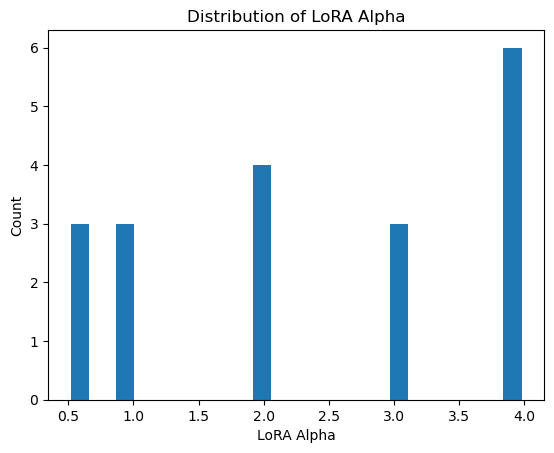

In [26]:
ax = df_best_alpha["lora_alpha"].hist(
    bins=20,
    grid=False,   # removes grid
    rwidth=0.8    # < 1 → adds spacing between bars
)

plt.xlabel("LoRA Alpha")
plt.ylabel("Count")
plt.title("Distribution of LoRA Alpha")
plt.show()

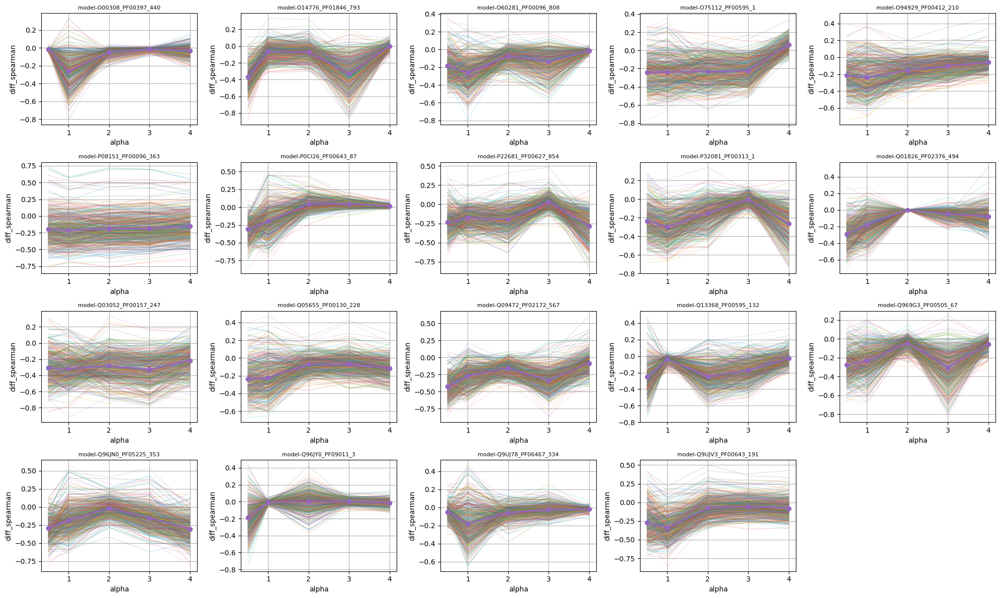

In [19]:
df_mean = (
    df_alpha
    .groupby(["model", "lora_alpha"], as_index=False)["diff_spearman"]
    .mean()
)

models = df_alpha["model"].unique()

ncols = 5
nrows = (len(models) + ncols - 1) // ncols

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 3 * nrows))
axes = axes.flatten()

for i, model in enumerate(models):
    ax = axes[i]

    # --- all domain curves (light background lines) ---
    df_model = df_alpha[df_alpha["model"] == model]

    for domain in df_model["domain_id"].unique():
        df_d = df_model[df_model["domain_id"] == domain].sort_values("lora_alpha")

        ax.plot(
            df_d["lora_alpha"],
            df_d["diff_spearman"],
            alpha=0.2,
            linewidth=1
        )

    # --- mean curve (bold overlay) ---
    df_m = df_mean[df_mean["model"] == model].sort_values("lora_alpha")

    ax.plot(
        df_m["lora_alpha"],
        df_m["diff_spearman"],
        marker="o",
        linewidth=2,
        label="mean"
    )

    ax.set_title(model, fontsize=8)
    ax.set_xlabel("alpha")
    ax.set_ylabel("diff_spearman")
    ax.grid(True)

# remove empty axes
for j in range(len(models), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [20]:
df_check = df_alpha[(df_alpha['model']=='model-Q01826_PF02376_494') &
                    (df_alpha['lora_alpha']==2)]


In [22]:
df_check.describe()

,lora_alpha,lora_spearman,base_spearman,diff_spearman
count,464.0,464.000000,464.000000,464.000000
mean,2.0,0.307339,0.307689,-0.000350
std,0.0,0.127755,0.127644,0.001123
min,2.0,-0.142918,-0.142876,-0.004825
25%,2.0,0.227042,0.228224,-0.000847
50%,2.0,0.310877,0.310752,-0.000257
75%,2.0,0.396893,0.397207,0.000147
max,2.0,0.667268,0.668016,0.006991


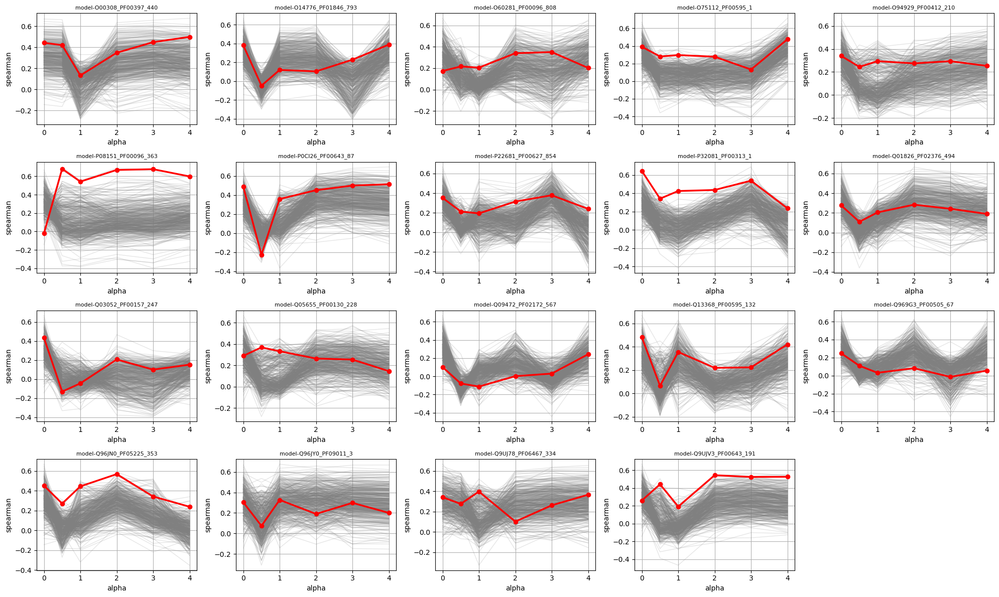

In [23]:
df_alpha_same = df_alpha[
    df_alpha["model"].str.split("-").str[1] == df_alpha["domain_id"]
]

models = df_alpha["model"].unique()

ncols = 5
nrows = (len(models) + ncols - 1) // ncols

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 3 * nrows))
axes = axes.flatten()

for i, model in enumerate(models):
    ax = axes[i]

    df_model = df_alpha[df_alpha["model"] == model]

    # -------------------------
    # GRAY: all domains (each with its own base)
    # -------------------------
    for domain in df_model["domain_id"].unique():
        df_d = df_model[df_model["domain_id"] == domain].sort_values("lora_alpha")

        base_val = df_d["base_spearman"].iloc[0]  # same for all rows in that domain

        x = [0] + df_d["lora_alpha"].tolist()
        y = [base_val] + df_d["lora_spearman"].tolist()

        ax.plot(
            x,
            y,
            color="gray",
            alpha=0.2,
            linewidth=1
        )

    # -------------------------
    # RED: matched domain (also per-domain base)
    # -------------------------
    df_match = df_alpha_same[df_alpha_same["model"] == model].sort_values("lora_alpha")

    if len(df_match) > 0:
        base_match = df_match["base_spearman"].iloc[0]

        x_red = [0] + df_match["lora_alpha"].tolist()
        y_red = [base_match] + df_match["lora_spearman"].tolist()

        ax.plot(
            x_red,
            y_red,
            color="red",
            linewidth=2.5,
            marker="o",
            label="matched domain"
        )

    ax.set_title(model, fontsize=8)
    ax.set_xlabel("alpha")
    ax.set_ylabel("spearman")
    ax.grid(True)

# remove empty axes
for j in range(len(models), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

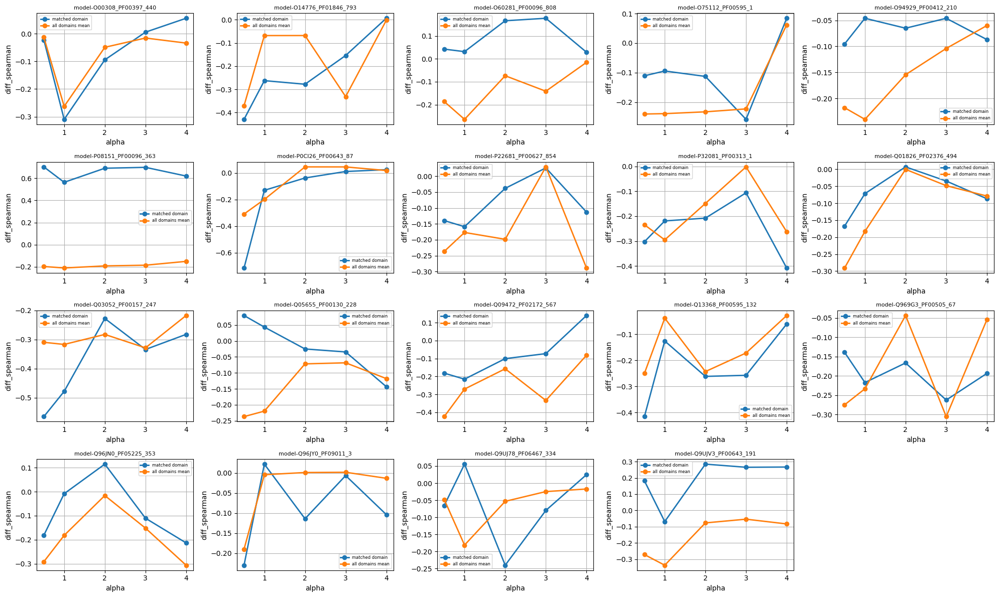

In [24]:
df_alpha_same = df_alpha[
    df_alpha["model"].str.split("-").str[1] == df_alpha["domain_id"]
]


df_model_mean = (
    df_alpha
    .groupby(["model", "lora_alpha"], as_index=False)["diff_spearman"]
    .mean()
)

models = df_alpha["model"].unique()

ncols = 5
nrows = (len(models) + ncols - 1) // ncols

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 3 * nrows))
axes = axes.flatten()

for i, model in enumerate(models):
    ax = axes[i]

    # --------------------------
    # Line 1: matched domain only
    # --------------------------
    df_match = df_alpha_same[df_alpha_same["model"] == model]
    df_match = df_match.sort_values("lora_alpha")

    ax.plot(
        df_match["lora_alpha"],
        df_match["diff_spearman"],
        marker="o",
        linewidth=2,
        label="matched domain"
    )

    # --------------------------
    # Line 2: mean over all domains
    # --------------------------
    df_mean = df_model_mean[df_model_mean["model"] == model]
    df_mean = df_mean.sort_values("lora_alpha")

    ax.plot(
        df_mean["lora_alpha"],
        df_mean["diff_spearman"],
        # linestyle="--",
        marker="o",
        linewidth=2,
        label="all domains mean"
    )

    ax.set_title(model, fontsize=8)
    ax.set_xlabel("alpha")
    ax.set_ylabel("diff_spearman")
    ax.grid(True)
    ax.legend(fontsize=6)

# clean up empty axes
for j in range(len(models), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

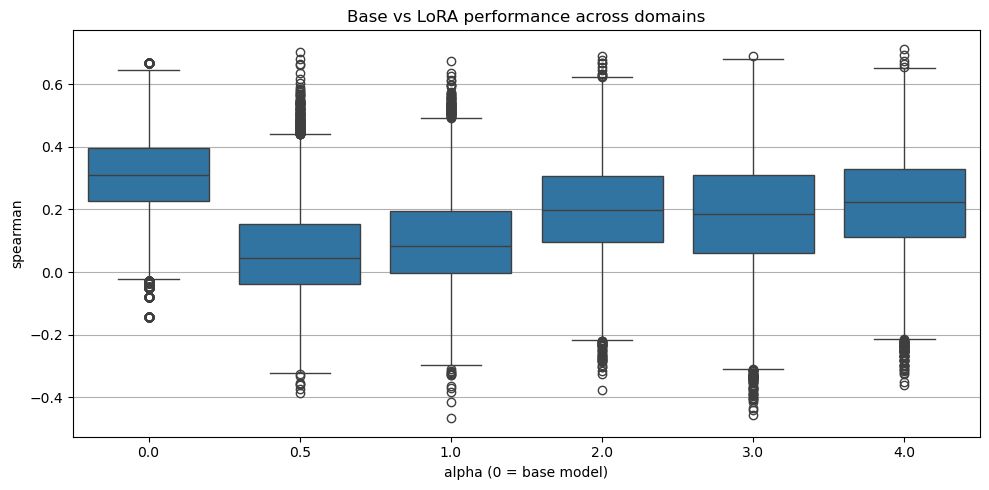

In [25]:
# LoRA data (as-is)
df_lora = df_alpha[["lora_alpha", "lora_spearman"]].copy()
df_lora["alpha"] = df_lora["lora_alpha"]

# Base data (alpha = 0)
df_base = df_alpha[["base_spearman"]].copy()
df_base["alpha"] = 0
df_base = df_base.rename(columns={"base_spearman": "lora_spearman"})

# Combine
df_box = pd.concat([df_lora, df_base], ignore_index=True)

plt.figure(figsize=(10, 5))

sns.boxplot(
    data=df_box,
    x="alpha",
    y="lora_spearman"
)

plt.xlabel("alpha (0 = base model)")
plt.ylabel("spearman")
plt.title("Base vs LoRA performance across domains")
plt.grid(True, axis="y")
plt.tight_layout()
plt.show()

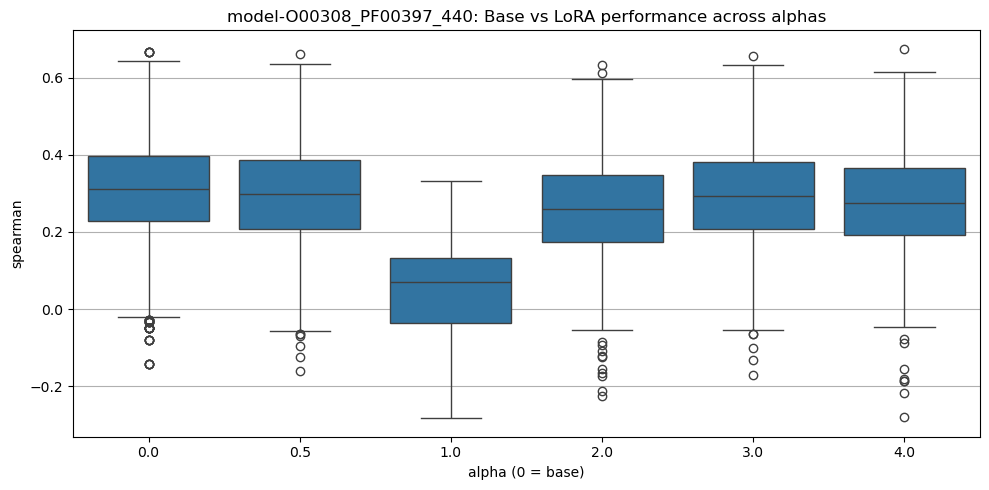

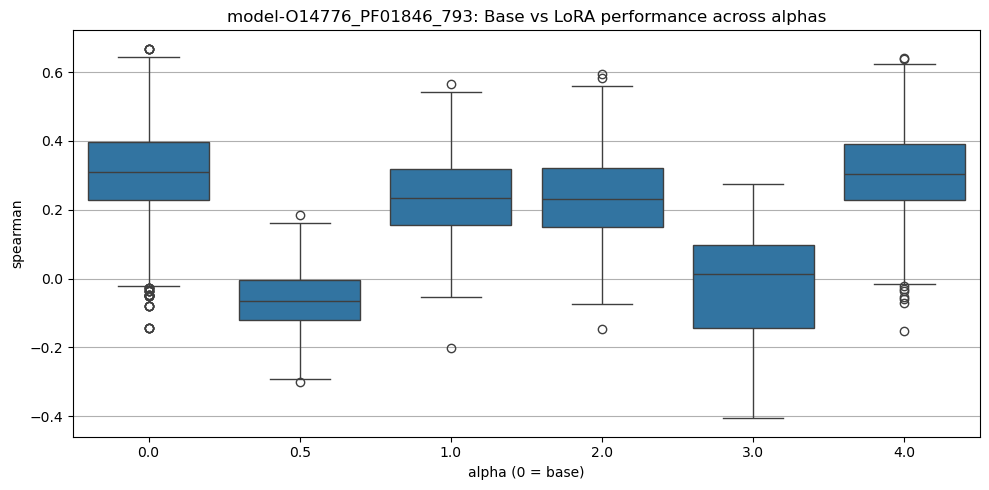

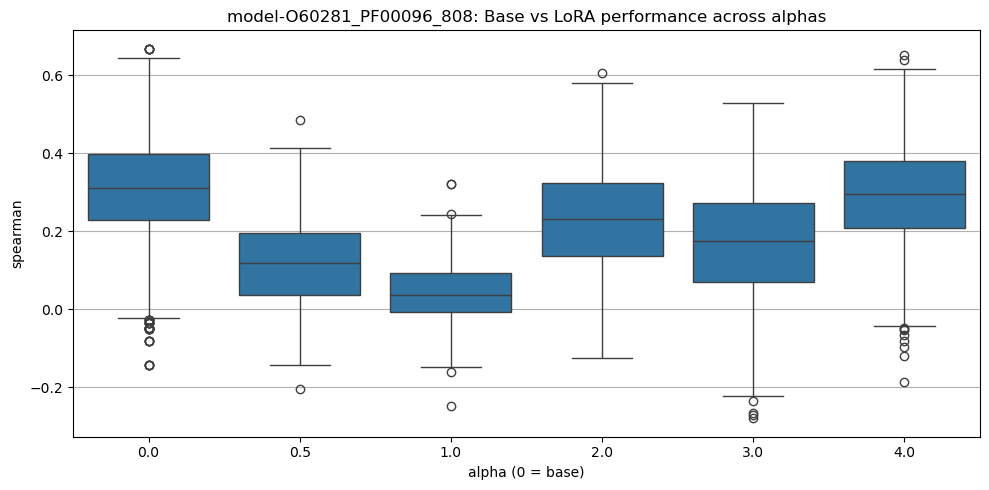

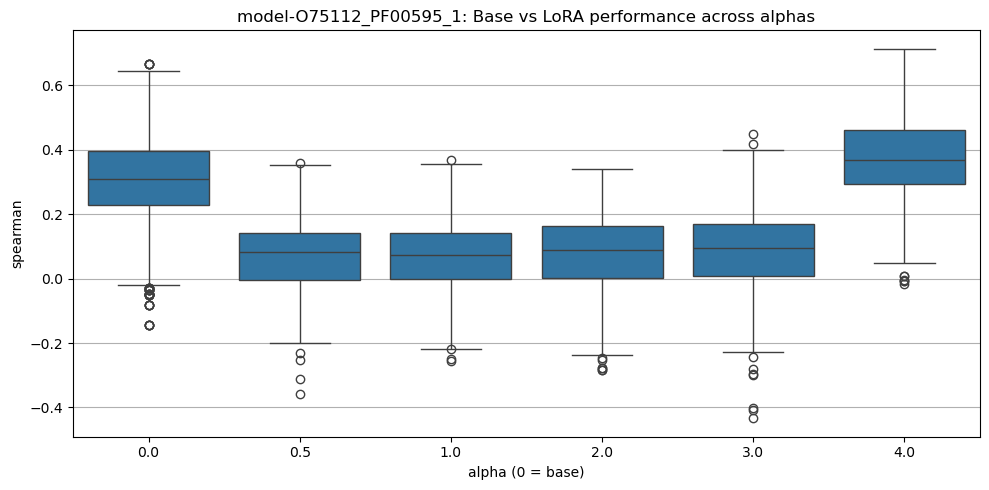

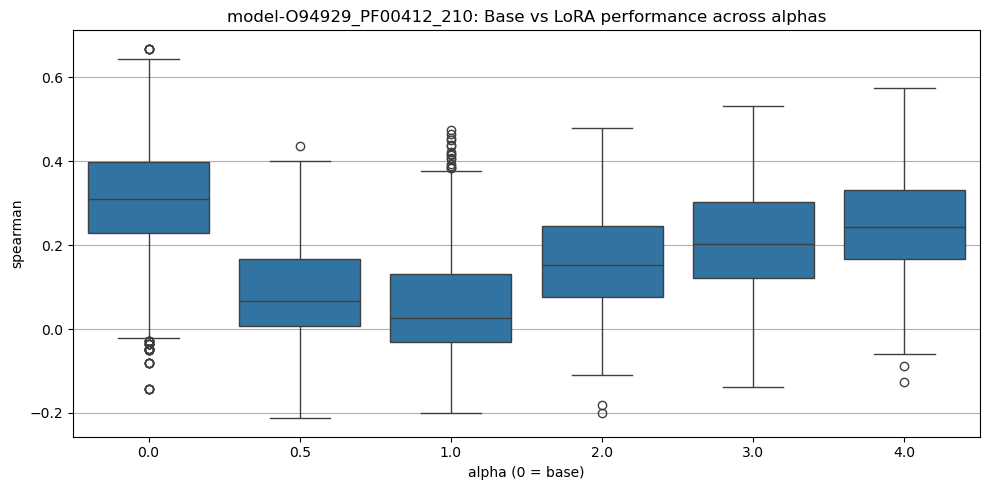

...

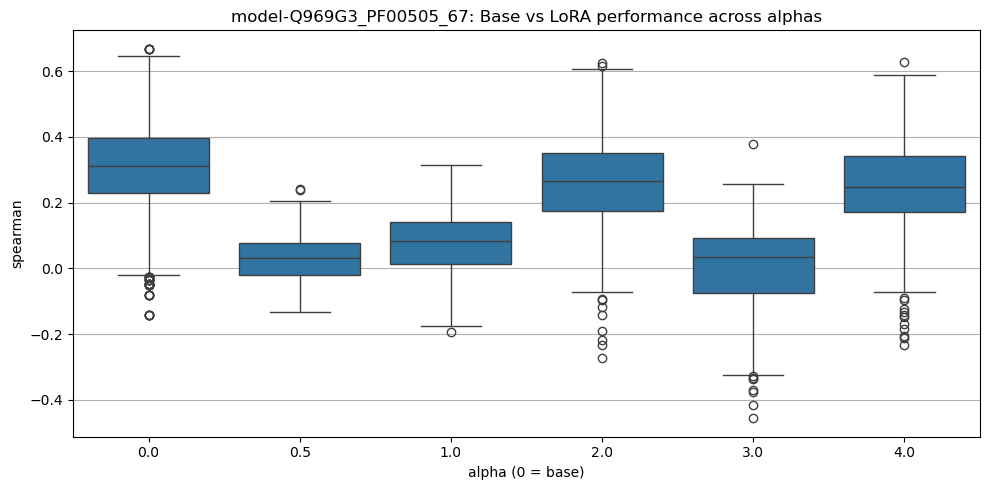

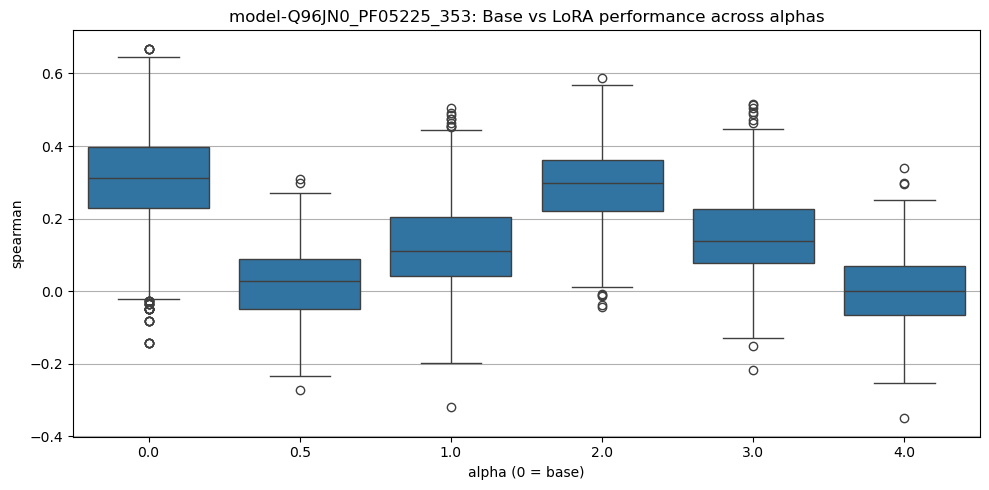

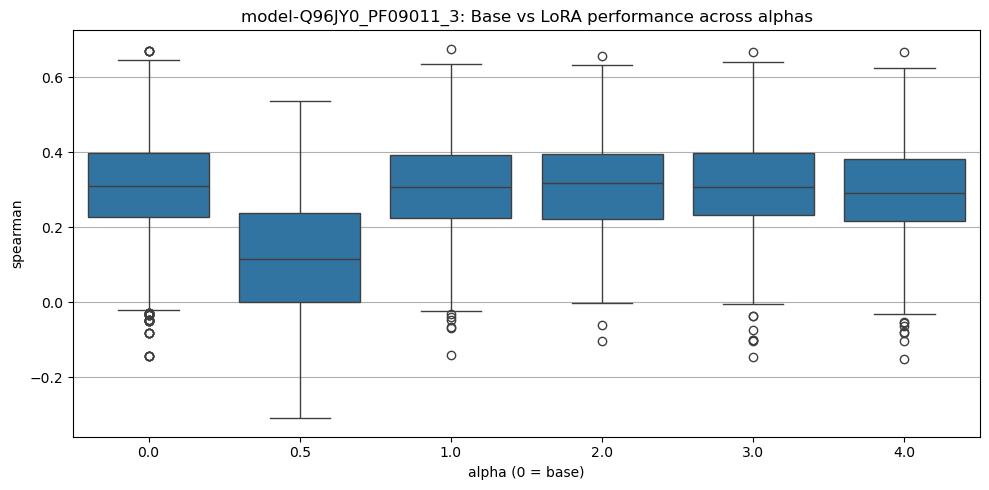

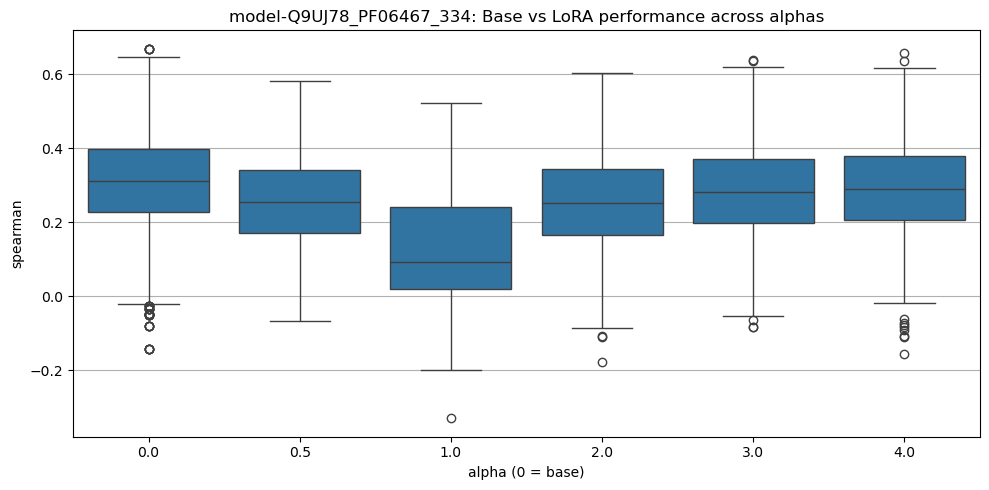

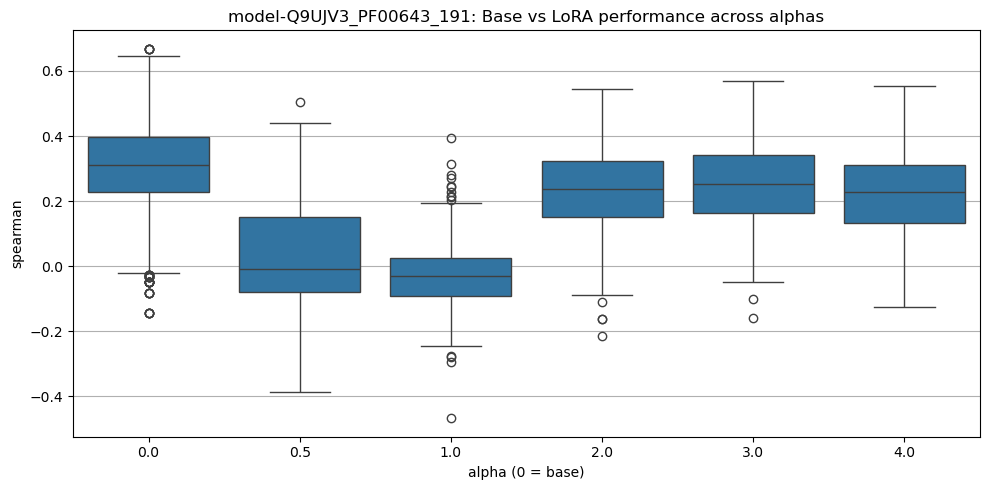

In [26]:
# LoRA
df_lora = df_alpha[["model", "lora_alpha", "lora_spearman"]].copy()
df_lora["alpha"] = df_lora["lora_alpha"]

# Base (alpha = 0)
df_base = df_alpha[["model", "base_spearman"]].copy()
df_base["alpha"] = 0
df_base = df_base.rename(columns={"base_spearman": "lora_spearman"})

df_box = pd.concat([df_lora, df_base], ignore_index=True)

models = df_box["model"].unique()

for model in models:
    plt.figure(figsize=(10, 5))

    df_m = df_box[df_box["model"] == model]

    # ensure consistent ordering (0 = base first)
    order = sorted(df_m["alpha"].unique())

    sns.boxplot(
        data=df_m,
        x="alpha",
        y="lora_spearman",
        order=order
    )

    plt.title(f"{model}: Base vs LoRA performance across alphas")
    plt.xlabel("alpha (0 = base)")
    plt.ylabel("spearman")
    plt.grid(True, axis="y")

    plt.tight_layout()
    plt.show()

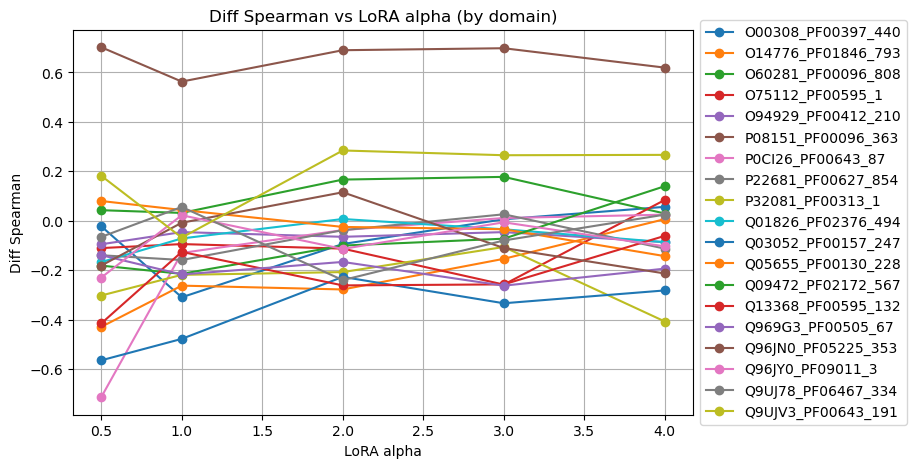

In [27]:
plt.figure(figsize=(8,5))

for domain in domains:
    df_plot = df_alpha_same[df_alpha_same["domain_id"] == domain]
    df_plot = df_plot.sort_values("lora_alpha")

    plt.plot(
        df_plot["lora_alpha"],
        df_plot["diff_spearman"],
        marker="o",
        label=domain
    )

plt.xlabel("LoRA alpha")
plt.ylabel("Diff Spearman")
plt.title("Diff Spearman vs LoRA alpha (by domain)")
plt.grid(True)
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))

plt.show()

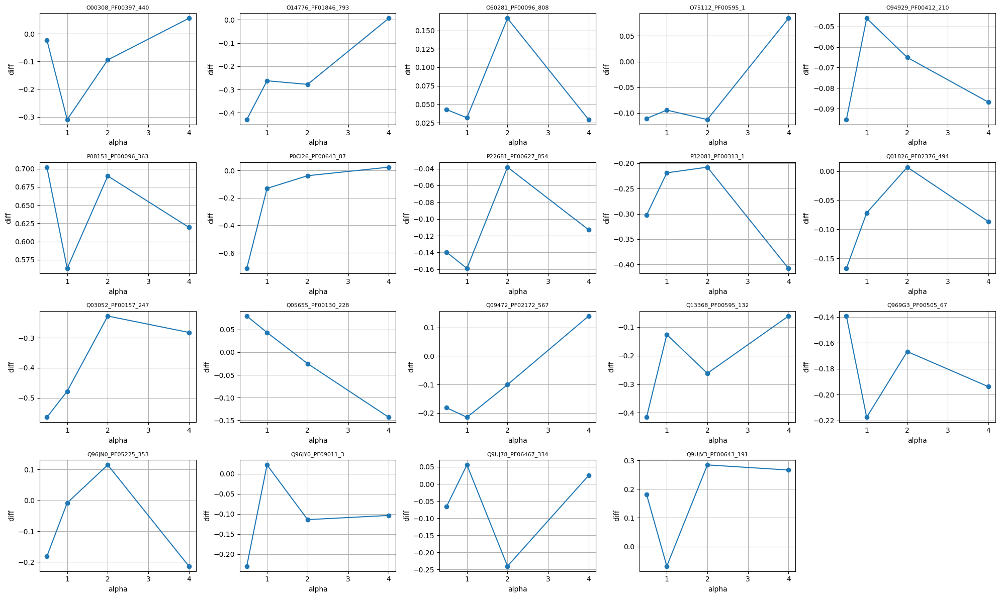

In [44]:
n_domains = len(domains)
ncols = 5
nrows = 4  # since you said 20

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 12))
axes = axes.flatten()  # makes indexing easy

for i, domain in enumerate(domains):
    ax = axes[i]

    df_plot = df_alpha_same[df_alpha_same["domain_id"] == domain]
    df_plot = df_plot.sort_values("lora_alpha")

    ax.plot(
        df_plot["lora_alpha"],
        df_plot["diff_spearman"],
        marker="o"
    )

    ax.set_title(domain, fontsize=8)
    ax.set_xlabel("alpha")
    ax.set_ylabel("diff")
    ax.grid(True)

# Hide any unused subplots (if domains < 20)
for j in range(len(domains), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

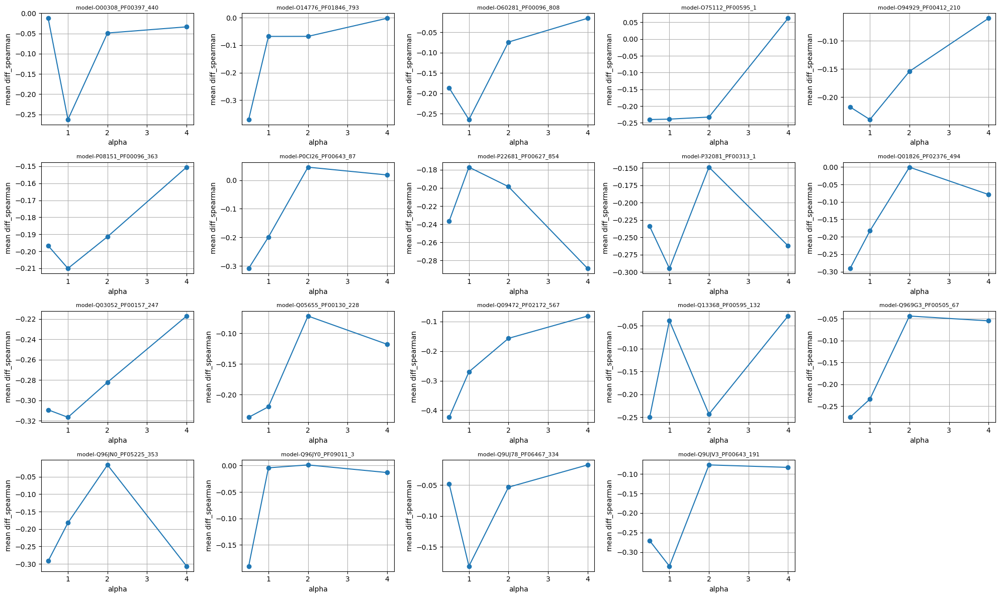

In [49]:
df_plot = (
    df_alpha
    .groupby(["model", "lora_alpha"], as_index=False)["diff_spearman"]
    .mean()
)

models = df_plot["model"].unique()

n_models = len(models)
ncols = 5
nrows = (n_models + ncols - 1) // ncols  # auto-fit rows

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 3 * nrows))
axes = axes.flatten()

for i, model in enumerate(models):
    ax = axes[i]

    df_m = df_plot[df_plot["model"] == model].sort_values("lora_alpha")

    ax.plot(
        df_m["lora_alpha"],
        df_m["diff_spearman"],
        marker="o"
    )

    ax.set_title(model, fontsize=8)
    ax.set_xlabel("alpha")
    ax.set_ylabel("mean diff_spearman")
    ax.grid(True)

# remove unused axes
for j in range(len(models), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

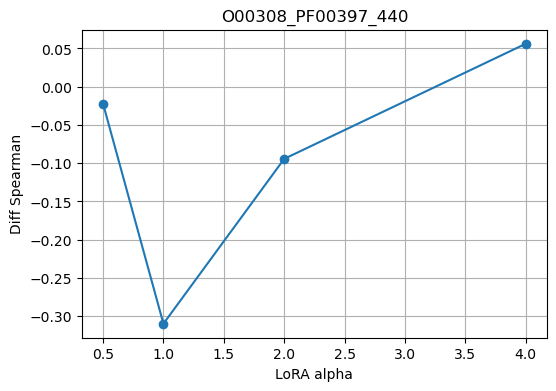

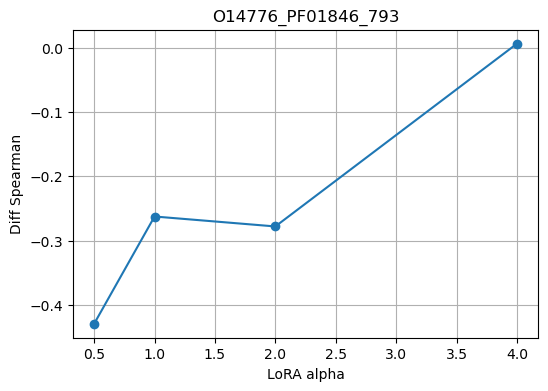

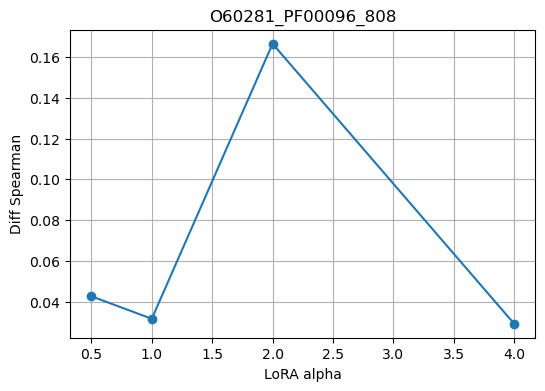

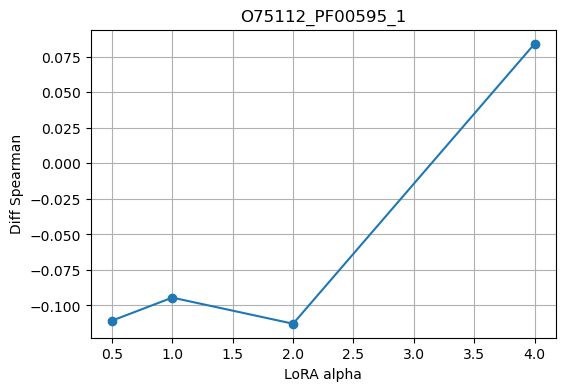

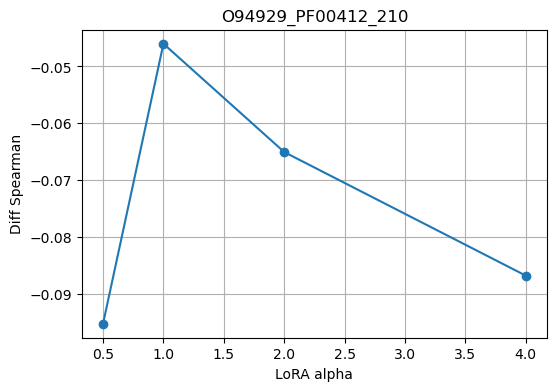

...

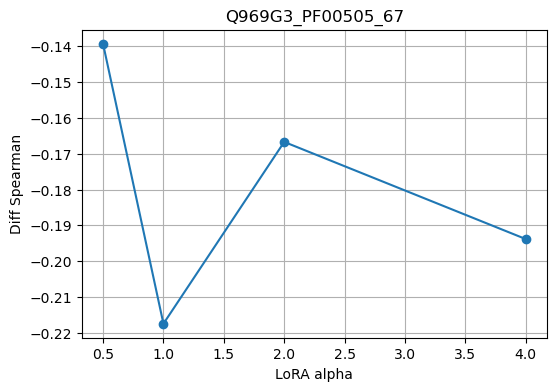

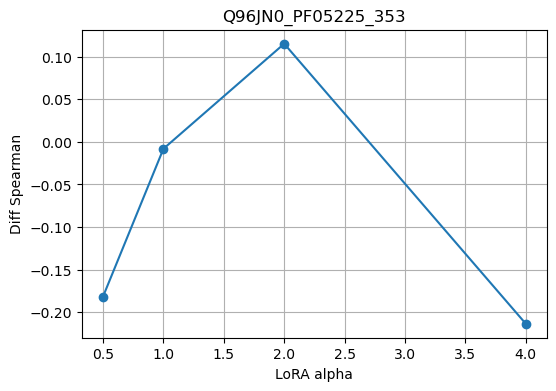

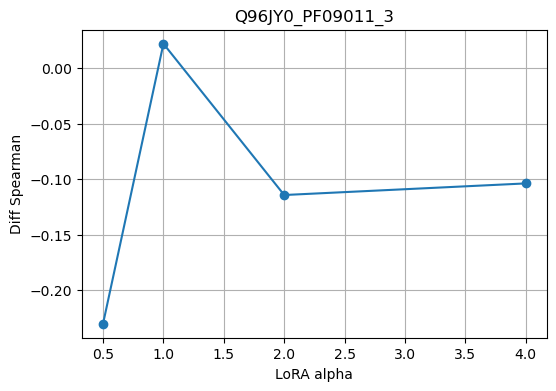

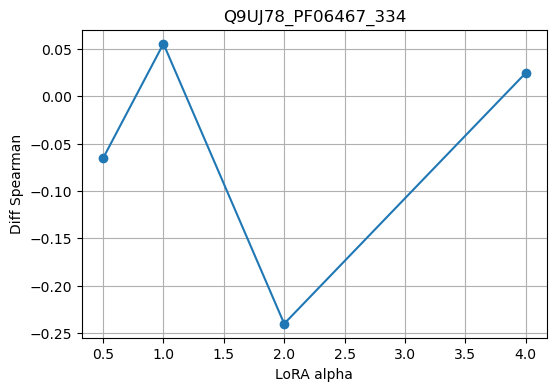

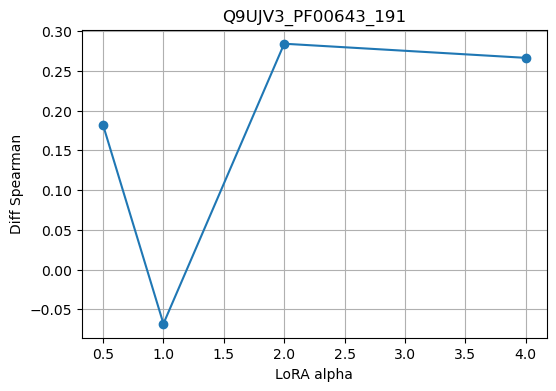

In [41]:
for i in range(len(domains)): 
    domain = domains[i]

    df_plot = df_alpha_same[df_alpha_same["domain_id"] == domain]
    df_plot = df_plot.sort_values("lora_alpha")

    plt.figure(figsize=(6,4))

    plt.plot(
        df_plot["lora_alpha"],
        df_plot["diff_spearman"],
        marker="o"
    )

    plt.xlabel("LoRA alpha")
    plt.ylabel("Diff Spearman")
    plt.title(f"{domain}")
    plt.grid(True)

    plt.show()

In [9]:
print(len(rows))

208800


In [10]:
df_spearman = pd.DataFrame(rows)
df_spearman.shape

(208800, 6)

In [11]:
df_spearman.head()

,model,domain_id,uniprot_id,lora_spearman,base_spearman,diff_spearman
0,model-A0PJY2_PF00096_289,A0PJY2_PF00096_289,A0PJY2,0.541086,0.064622,0.476464
1,model-A0PJY2_PF00096_289,A1X283_PF00018_155,A1X283,-0.119528,0.407009,-0.526537
2,model-A0PJY2_PF00096_289,A1X283_PF00018_222,A1X283,-0.031525,0.286978,-0.318503
3,model-A0PJY2_PF00096_289,A6NK59_PF07525_532,A6NK59,0.094267,0.023704,0.070564
4,model-A0PJY2_PF00096_289,O00308_PF00397_440,O00308,0.124206,0.442646,-0.318440


In [13]:
df_spearman.describe()

,lora_spearman,base_spearman,diff_spearman
count,208800.000000,208800.000000,208800.000000
mean,0.174854,0.307689,-0.132835
std,0.163782,0.127507,0.166972
min,-0.546371,-0.142876,-1.016991
25%,0.061521,0.228224,-0.235284
50%,0.173044,0.310752,-0.104975
75%,0.288958,0.397207,-0.008854
max,0.768334,0.668016,0.787435


In [ ]:
df_spearman['model_dom_id'] = df_spearman['model'].str.split('-').str[1]
df_spearman['model_uid'] = df_spearman['model'].str.split('-').str[1].str.split('_').str[0]
df_spearman['model_pfam'] = df_spearman['model'].str.split('-').str[1].str.split('_').str[1]
df_spearman['pfam_id'] = df_spearman['domain_id'].str.split('_').str[1]
df_spearman.columns

In [ ]:
df_spearman = df_spearman[['model', 'model_uid', 'model_dom_id', 'model_pfam', 'uniprot_id', 'domain_id', 'pfam_id', 'base_spearman', 'lora_spearman', 'diff_spearman']]


In [61]:
df_spearman.head()

,model,model_uid,model_pfam,uniprot_id,domain_id,pfam_id,base_spearman,lora_spearman,diff_spearman
0,model-A0PJY2_PF00096_289,A0PJY2,PF00096,A0PJY2,A0PJY2_PF00096_289,PF00096,0.064622,0.541086,0.476464
1,model-A0PJY2_PF00096_289,A0PJY2,PF00096,A1X283,A1X283_PF00018_155,PF00018,0.407009,-0.119528,-0.526537
2,model-A0PJY2_PF00096_289,A0PJY2,PF00096,A1X283,A1X283_PF00018_222,PF00018,0.286978,-0.031525,-0.318503
3,model-A0PJY2_PF00096_289,A0PJY2,PF00096,A6NK59,A6NK59_PF07525_532,PF07525,0.023704,0.094267,0.070564
4,model-A0PJY2_PF00096_289,A0PJY2,PF00096,O00308,O00308_PF00397_440,PF00397,0.442646,0.124206,-0.318440


In [ ]:
df_hm = df_spearman.copy()

In [74]:
df_hm = df_hm.sort_values(["model_pfam", "model_uid", "model"])
df_hm = df_hm.sort_values(["pfam_id", "uniprot_id", "domain_id"])

In [75]:
df_hm["y_key"] = (
    df_hm["model_pfam"].astype(str) + " | " +
    df_hm["model_uid"].astype(str) + " | " +
    df_hm["model"].astype(str)
)

df_hm["x_key"] = (
    df_hm["pfam_id"].astype(str) + " | " +
    df_hm["uniprot_id"].astype(str) + " | " +
    df_hm["domain_id"].astype(str)
)

In [76]:
df_hm["model_pfam"] = pd.Categorical(
    df_hm["model_pfam"],
    categories=sorted(df_hm["model_pfam"].unique()),
    ordered=True
)

df_hm["pfam_id"] = pd.Categorical(
    df_hm["pfam_id"],
    categories=sorted(df_hm["pfam_id"].unique()),
    ordered=True
)

df_hm = df_hm.sort_values(["model_pfam", "model_uid", "model", "pfam_id", "uniprot_id", "domain_id"])

In [77]:
df_hm.head()

,model,model_uid,model_pfam,uniprot_id,domain_id,pfam_id,base_spearman,lora_spearman,diff_spearman,y_key,x_key
80911,model-P50539_PF00010_70,P50539,PF00010,P50539,P50539_PF00010_70,PF00010,0.235717,0.222634,-0.013084,PF00010 | P50539 | model-P50539_PF00010_70,PF00010 | P50539 | P50539_PF00010_70
80959,model-P50539_PF00010_70,P50539,PF00010,Q05195,Q05195_PF00010_58,PF00010,0.234749,0.230715,-0.004034,PF00010 | P50539 | model-P50539_PF00010_70,PF00010 | Q05195 | Q05195_PF00010_58
80935,model-P50539_PF00010_70,P50539,PF00010,P61978,P61978_PF00013_385,PF00013,0.200327,0.243618,0.043290,PF00010 | P50539 | model-P50539_PF00010_70,PF00013 | P61978 | P61978_PF00013_385
80963,model-P50539_PF00010_70,P50539,PF00010,Q06787,Q06787_PF00013_217,PF00013,0.270634,0.321013,0.050379,PF00010 | P50539 | model-P50539_PF00010_70,PF00013 | Q06787 | Q06787_PF00013_217
81002,model-P50539_PF00010_70,P50539,PF00010,Q15365,Q15365_PF00013_278,PF00013,0.486743,0.406264,-0.080479,PF00010 | P50539 | model-P50539_PF00010_70,PF00013 | Q15365 | Q15365_PF00013_278


In [78]:
df_hm_pivot = df_hm.pivot(
    index="y_key",
    columns="x_key",
    values="diff_spearman"
)

In [79]:
plt.figure(figsize=(80, 80))

sns.heatmap(
    df_hm_pivot,
    cmap="RdBu_r",
    center=0,
    cbar_kws={"label": "Spearman Difference (LoRA - Base)"},
)

plt.xticks(rotation=90)
plt.xlabel("pfam_id | uniprot_id | domain_id")
plt.ylabel("pfam_id | model_uid | model")
plt.title("Spearman Difference Heatmap")

plt.tight_layout()
plt.show()

In [16]:
df_spearman.describe()

,base_spearman,lora_spearman,diff_spearman
count,208800.000000,208800.000000,208800.000000
mean,0.307689,0.174854,-0.132835
std,0.127507,0.163782,0.166972
min,-0.142876,-0.546371,-1.016991
25%,0.228224,0.061521,-0.235284
50%,0.310752,0.173044,-0.104975
75%,0.397207,0.288958,-0.008854
max,0.668016,0.768334,0.787435


In [17]:
df_spearman[df_spearman['model_pfam']==df_spearman['pfam_id']].describe()

,base_spearman,lora_spearman,diff_spearman
count,6126.000000,6126.000000,6126.000000
mean,0.303403,0.207980,-0.095423
std,0.140880,0.155809,0.194375
min,-0.142876,-0.515939,-0.856193
25%,0.215938,0.098616,-0.213358
50%,0.313054,0.204981,-0.088906
75%,0.401206,0.314374,0.005205
max,0.668016,0.690097,0.787435


In [20]:
df_spearman[df_spearman['model_pfam']==df_spearman['pfam_id']].head()

,model,model_uid,model_pfam,uniprot_id,domain_id,pfam_id,base_spearman,lora_spearman,diff_spearman
0,model-A0PJY2_PF00096_289,A0PJY2,PF00096,A0PJY2,A0PJY2_PF00096_289,PF00096,0.064622,0.541086,0.476464
15,model-A0PJY2_PF00096_289,A0PJY2,PF00096,O14901,O14901_PF00096_395,PF00096,0.027786,0.340082,0.312297
25,model-A0PJY2_PF00096_289,A0PJY2,PF00096,O43167,O43167_PF00096_351,PF00096,0.216471,0.045349,-0.171121
26,model-A0PJY2_PF00096_289,A0PJY2,PF00096,O43167,O43167_PF00096_435,PF00096,0.336620,0.347464,0.010844
33,model-A0PJY2_PF00096_289,A0PJY2,PF00096,O60281,O60281_PF00096_808,PF00096,0.173900,0.117530,-0.056370


In [18]:
df_spearman[df_spearman['model_uid'] == df_spearman['uniprot_id']].describe()

,base_spearman,lora_spearman,diff_spearman
count,642.000000,642.000000,642.000000
mean,0.303704,0.236010,-0.067695
std,0.124441,0.160649,0.186910
min,-0.142876,-0.515939,-0.721155
25%,0.227639,0.132224,-0.172732
50%,0.304558,0.236850,-0.064915
75%,0.383863,0.348339,0.023369
max,0.668016,0.668979,0.787435


In [19]:
df_spearman[df_spearman['model'].str.split('-').str[1] == df_spearman['domain_id']].describe()

,base_spearman,lora_spearman,diff_spearman
count,450.000000,450.000000,450.000000
mean,0.307540,0.259987,-0.047553
std,0.127651,0.157004,0.188329
min,-0.142876,-0.515939,-0.721155
25%,0.228317,0.165618,-0.147434
50%,0.310651,0.260848,-0.049879
75%,0.397163,0.363300,0.043769
max,0.668016,0.668979,0.787435


In [25]:
df = df_spearman
print("=" * 60)
print("STATISTICAL ANALYSIS — Wilcoxon Signed-Rank Test (paired)")
print("=" * 60)

sig_dict  = {}
pval_dict = {}

family_order = sorted(df["pfam_id"].unique())

for pfam in family_order:
    subset = df[df["pfam_id"] == pfam]

    base = subset["base_spearman"].values
    ft   = subset["lora_spearman"].values

    print(f"\n{pfam} (n={len(base)}):")
    print(f"  Baseline median:   {np.nanmedian(base):.4f}")
    print(f"  Fine-tuned median: {np.nanmedian(ft):.4f}")

    # drop NaNs + ensure pairing
    mask = ~np.isnan(base) & ~np.isnan(ft)
    base_clean = base[mask]
    ft_clean   = ft[mask]

    if len(base_clean) < 3:
        sig_dict[pfam]  = "ns"
        pval_dict[pfam] = None
        print("  Too few obs — skipping test")
        continue

    try:
        _, p = wilcoxon(base_clean, ft_clean)

        pval_dict[pfam] = p

        if p < 0.001:
            sig = "***"
        elif p < 0.01:
            sig = "**"
        elif p < 0.05:
            sig = "*"
        else:
            sig = "ns"

        sig_dict[pfam] = sig

        print(f"  p = {p:.4e}  →  {sig}")

    except Exception as e:
        sig_dict[pfam]  = "ns"
        pval_dict[pfam] = None
        print(f"  Test failed: {e}")

print("=" * 60)

STATISTICAL ANALYSIS — Wilcoxon Signed-Rank Test (paired)

PF00010 (n=900):
  Baseline median:   0.2352
  Fine-tuned median: 0.0947
  p = 3.3795e-133  →  ***

PF00013 (n=4050):
  Baseline median:   0.3455
  Fine-tuned median: 0.1780
  p = 0.0000e+00  →  ***

PF00018 (n=13050):
  Baseline median:   0.4070
  Fine-tuned median: 0.1930
  p = 0.0000e+00  →  ***

PF00030 (n=4950):
  Baseline median:   0.3179
  Fine-tuned median: 0.1779
  p = 0.0000e+00  →  ***

PF00035 (n=900):
  Baseline median:   0.3931
  Fine-tuned median: 0.1949
  p = 1.6085e-126  →  ***

PF00046 (n=13050):
  Baseline median:   0.2322
  Fine-tuned median: 0.1744
  p = 0.0000e+00  →  ***

PF00096 (n=15300):
  Baseline median:   0.2162
  Fine-tuned median: 0.1775
  p = 3.7527e-87  →  ***

PF00105 (n=4500):
  Baseline median:   0.2424
  Fine-tuned median: 0.1990
  p = 4.9020e-89  →  ***

PF00130 (n=1350):
  Baseline median:   0.3844
  Fine-tuned median: 0.2425
  p = 2.0410e-148  →  ***

PF00157 (n=5400):
  Baseline median: 

In [59]:
df = df_spearman
print("=" * 60)
print("STATISTICAL ANALYSIS — Wilcoxon Signed-Rank Test (paired)")
print("=" * 60)

sig_dict  = {}
pval_dict = {}

family_order = sorted(df["pfam_id"].unique())

for pfam in family_order:
    subset = df[df["pfam_id"] == pfam]

    base = subset["base_spearman"].values
    ft   = subset["lora_spearman"].values
    base_med = np.nanmedian(base)
    ft_med = np.nanmedian(ft)

    if ft_med > base_med:
        print(f"\n{pfam} (n={len(base)}):")
        print(f"  Baseline median:   {base_med:.4f}")
        print(f"  Fine-tuned median: {ft_med:.4f}")

        # drop NaNs + ensure pairing
        mask = ~np.isnan(base) & ~np.isnan(ft)
        base_clean = base[mask]
        ft_clean   = ft[mask]

        if len(base_clean) < 3:
            sig_dict[pfam]  = "ns"
            pval_dict[pfam] = None
            print("  Too few obs — skipping test")
            continue

        try:
            _, p = wilcoxon(base_clean, ft_clean)

            pval_dict[pfam] = p

            if p < 0.001:
                sig = "***"
            elif p < 0.01:
                sig = "**"
            elif p < 0.05:
                sig = "*"
            else:
                sig = "ns"

            sig_dict[pfam] = sig

            print(f"  p = {p:.4e}  →  {sig}")

        except Exception as e:
            sig_dict[pfam]  = "ns"
            pval_dict[pfam] = None
            print(f"  Test failed: {e}")

print("=" * 60)

STATISTICAL ANALYSIS — Wilcoxon Signed-Rank Test (paired)

PF00831 (n=450):
  Baseline median:   0.1340
  Fine-tuned median: 0.1350
  p = 3.1701e-02  →  *

PF07533 (n=450):
  Baseline median:   0.0821
  Fine-tuned median: 0.0888
  p = 1.9358e-01  →  ns

PF08313 (n=450):
  Baseline median:   0.2329
  Fine-tuned median: 0.2351
  p = 2.9159e-04  →  ***


In [60]:
df = df_spearman
print("=" * 60)
print("STATISTICAL ANALYSIS — Wilcoxon Signed-Rank Test (paired)")
print("=" * 60)

sig_dict  = {}
pval_dict = {}

family_order = sorted(df["pfam_id"].unique())

for pfam in family_order:
    subset = df[df["pfam_id"] == pfam]

    base = subset["base_spearman"].values
    ft   = subset["lora_spearman"].values
    base_mean = np.nanmean(base)
    ft_mean = np.nanmean(ft)

    if ft_mean > base_mean:
        print(f"\n{pfam} (n={len(base)}):")
        print(f"  Baseline mean:   {base_mean:.4f}")
        print(f"  Fine-tuned mean: {ft_mean:.4f}")

        # drop NaNs + ensure pairing
        mask = ~np.isnan(base) & ~np.isnan(ft)
        base_clean = base[mask]
        ft_clean   = ft[mask]

        if len(base_clean) < 3:
            sig_dict[pfam]  = "ns"
            pval_dict[pfam] = None
            print("  Too few obs — skipping test")
            continue

        try:
            _, p = wilcoxon(base_clean, ft_clean)

            pval_dict[pfam] = p

            if p < 0.001:
                sig = "***"
            elif p < 0.01:
                sig = "**"
            elif p < 0.05:
                sig = "*"
            else:
                sig = "ns"

            sig_dict[pfam] = sig

            print(f"  p = {p:.4e}  →  {sig}")

        except Exception as e:
            sig_dict[pfam]  = "ns"
            pval_dict[pfam] = None
            print(f"  Test failed: {e}")

print("=" * 60)

STATISTICAL ANALYSIS — Wilcoxon Signed-Rank Test (paired)

PF07533 (n=450):
  Baseline mean:   0.0821
  Fine-tuned mean: 0.0848
  p = 1.9358e-01  →  ns


In [155]:
df_spearman.columns

Index(['model', 'model_uid', 'model_pfam', 'uniprot_id', 'domain_id',
       'pfam_id', 'base_spearman', 'lora_spearman', 'diff_spearman'],
      dtype='object')

In [158]:
long_df = df_spearman.copy()
family_order = sorted(long_df["pfam_id"].unique())
long_df = long_df[long_df['model_dom_id']==long_df['domain_id']]

In [159]:
baseline = (
    long_df[["pfam_id", "domain_id", "base_spearman"]]
    .drop_duplicates(subset=["pfam_id", "domain_id"])
    .rename(columns={"base_spearman": "spearman"})
)

baseline["condition"] = "Baseline"

In [160]:
lora = long_df[["pfam_id", "domain_id", "lora_spearman"]].copy()
lora = lora.rename(columns={"lora_spearman": "spearman"})
lora["condition"] = "Fine-tuned"

In [161]:
long_df = pd.concat([baseline,lora], ignore_index=True)

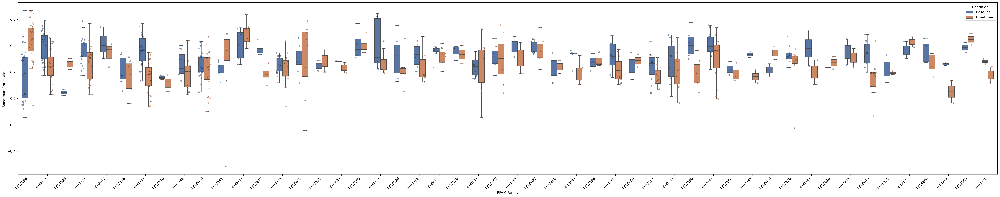

In [162]:
fig, ax = plt.subplots(figsize=(40, 8), dpi=300)

palette = {"Baseline": "#4C72B0", "Fine-tuned": "#DD8452"}
dot_palette = palette

baseline_counts = (
    long_df[long_df["condition"] == "Baseline"]
    .groupby("pfam_id")
    .size()
)

valid_pfams = baseline_counts[baseline_counts > 1].index

plot_df = long_df[long_df["pfam_id"].isin(valid_pfams)]


sns.boxplot(
    data=plot_df,
    x="pfam_id",
    y="spearman",
    hue="condition",
    # order=family_order,
    hue_order=["Baseline", "Fine-tuned"],
    palette=palette,
    width=0.6,
    linewidth=1.2,
    fliersize=0,
    ax=ax,
)

sns.stripplot(
    data=plot_df,
    x="pfam_id",
    y="spearman",
    hue="condition",
    # order=family_order,
    hue_order=["Baseline", "Fine-tuned"],
    dodge=True,
    size=4,
    alpha=0.6,
    jitter=0.2,
    palette=dot_palette,
    edgecolor="black",
    linewidth=0.3,
    ax=ax,
)

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:2], labels[:2], title="Condition")

ax.set_xlabel("PFAM Family")
ax.set_ylabel("Spearman Correlation")
plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()

In [163]:
PFAMs = list(long_df['pfam_id'].unique())

PF02376


/var/folders/30/5r4_75_n4bz34nyphw8tfv3m0000gn/T/ipykernel_2460/3989528370.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df["x"] = PFAM


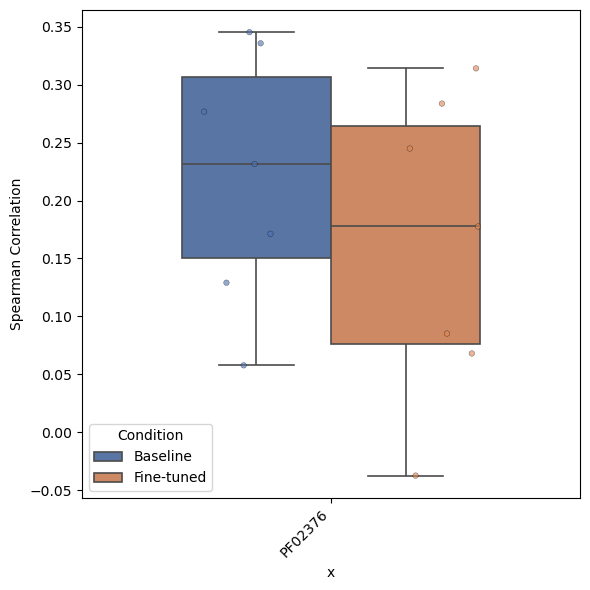

In [164]:
fig, ax = plt.subplots(figsize=(6, 6))

palette = {"Baseline": "#4C72B0", "Fine-tuned": "#DD8452"}
dot_palette = palette

i = 5
PFAM = PFAMs[i]
print(PFAM)
data_df = long_df[long_df['pfam_id']==PFAM]
data_df["x"] = PFAM

sns.boxplot(
    data=data_df,
    x="x",
    y="spearman",
    hue="condition",
    # order=family_order,
    hue_order=["Baseline", "Fine-tuned"],
    palette=palette,
    width=0.6,
    linewidth=1.2,
    fliersize=0,
    ax=ax,
)

sns.stripplot(
    data=data_df,
    x="x",
    y="spearman",
    hue="condition",
    # order=family_order,
    hue_order=["Baseline", "Fine-tuned"],
    dodge=True,
    size=4,
    alpha=0.6,
    jitter=0.2,
    palette=dot_palette,
    edgecolor="black",
    linewidth=0.3,
    ax=ax,
)

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:2], labels[:2], title="Condition")

# ax.set_xlabel("PFAM Family")
ax.set_ylabel("Spearman Correlation")
plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()

In [128]:
long_df = df_spearman.copy()
family_order = sorted(long_df["pfam_id"].unique())
long_df = long_df[long_df['pfam_id']==long_df['model_pfam']]

In [129]:
baseline = (
    long_df[["pfam_id", "domain_id", "base_spearman"]]
    .drop_duplicates(subset=["pfam_id", "domain_id"])
    .rename(columns={"base_spearman": "spearman"})
)

baseline["condition"] = "Baseline"

In [148]:
lora_pfam = long_df[["pfam_id", "domain_id", "lora_spearman"]].copy()
lora_pfam = lora_pfam.rename(columns={"lora_spearman": "spearman"})
lora_pfam["condition"] = "Fine-tuned"

In [149]:
long_df_pfam = pd.concat([baseline,lora_pfam], ignore_index=True)

In [150]:
long_df_pfam.shape

(6589, 4)

In [151]:
long_df_pfam.head()

,pfam_id,domain_id,spearman,condition
0,PF00096,A0PJY2_PF00096_289,0.064622,Baseline
1,PF00096,O14901_PF00096_395,0.027786,Baseline
2,PF00096,O43167_PF00096_351,0.216471,Baseline
3,PF00096,O43167_PF00096_435,0.336620,Baseline
4,PF00096,O60281_PF00096_808,0.173900,Baseline


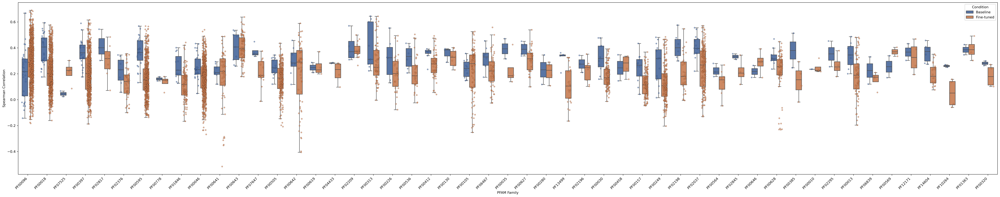

In [152]:
fig, ax = plt.subplots(figsize=(40, 8), dpi=300)

palette = {"Baseline": "#4C72B0", "Fine-tuned": "#DD8452"}
dot_palette = palette

baseline_counts = (
    long_df_pfam[long_df_pfam["condition"] == "Baseline"]
    .groupby("pfam_id")
    .size()
)

valid_pfams = baseline_counts[baseline_counts > 1].index

plot_df = long_df_pfam[long_df_pfam["pfam_id"].isin(valid_pfams)]


sns.boxplot(
    data=plot_df,
    x="pfam_id",
    y="spearman",
    hue="condition",
    # order=family_order,
    hue_order=["Baseline", "Fine-tuned"],
    palette=palette,
    width=0.6,
    linewidth=1.2,
    fliersize=0,
    ax=ax,
)

sns.stripplot(
    data=plot_df,
    x="pfam_id",
    y="spearman",
    hue="condition",
    # order=family_order,
    hue_order=["Baseline", "Fine-tuned"],
    dodge=True,
    size=4,
    alpha=0.6,
    jitter=0.2,
    palette=dot_palette,
    edgecolor="black",
    linewidth=0.3,
    ax=ax,
)

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:2], labels[:2], title="Condition")

ax.set_xlabel("PFAM Family")
ax.set_ylabel("Spearman Correlation")
plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()

In [153]:
PFAMs = list(long_df_cc['pfam_id'].unique())

PF02376


/var/folders/30/5r4_75_n4bz34nyphw8tfv3m0000gn/T/ipykernel_2460/3674277079.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df["x"] = PFAM


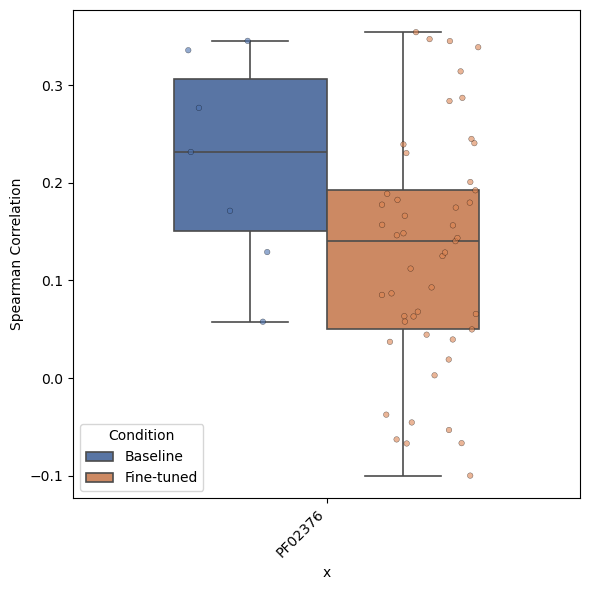

In [154]:
fig, ax = plt.subplots(figsize=(6, 6))

palette = {"Baseline": "#4C72B0", "Fine-tuned": "#DD8452"}
dot_palette = palette

i = 5
PFAM = PFAMs[i]
print(PFAM)
data_df = long_df_pfam[long_df_pfam['pfam_id']==PFAM]
data_df["x"] = PFAM

sns.boxplot(
    data=data_df,
    x="x",
    y="spearman",
    hue="condition",
    # order=family_order,
    hue_order=["Baseline", "Fine-tuned"],
    palette=palette,
    width=0.6,
    linewidth=1.2,
    fliersize=0,
    ax=ax,
)

sns.stripplot(
    data=data_df,
    x="x",
    y="spearman",
    hue="condition",
    # order=family_order,
    hue_order=["Baseline", "Fine-tuned"],
    dodge=True,
    size=4,
    alpha=0.6,
    jitter=0.2,
    palette=dot_palette,
    edgecolor="black",
    linewidth=0.3,
    ax=ax,
)

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:2], labels[:2], title="Condition")

# ax.set_xlabel("PFAM Family")
ax.set_ylabel("Spearman Correlation")
plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()